# <p style="background-image: url(https://png.pngtree.com/thumb_back/fh260/background/20231027/pngtree-hexagonal-abstract-background-with-a-black-textured-surface-image_13704307.png);font-family:calibri;font-size:140%;color: #FFD700; text-align:center;border-radius:20px 20px 20px 20px; padding:20px; border:solid 7px #FFD700;"> **MRI IMAGES CLASSIFICATION USING YOLO** 

# <p style="background-image: url(https://png.pngtree.com/thumb_back/fh260/background/20231027/pngtree-hexagonal-abstract-background-with-a-black-textured-surface-image_13704307.png);font-family:calibri;font-size:140%;color: #FFD700; text-align:center;border-radius:20px 20px 20px 20px; padding:20px; border:solid 7px #FFD700;"> **IMPORTING LIBRARIES** 

In [6]:
import albumentations as A
import numpy as np
import cv2
from PIL import Image
from pathlib import Path
from tqdm import tqdm
import yaml
import os
import random
import pandas as pd
import seaborn as sns
import plotly.graph_objects as go
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from ultralytics.utils import metrics

# <p style="background-image: url(https://png.pngtree.com/thumb_back/fh260/background/20231027/pngtree-hexagonal-abstract-background-with-a-black-textured-surface-image_13704307.png);font-family:calibri;font-size:140%;color: #FFD700; text-align:center;border-radius:20px 20px 20px 20px; padding:20px; border:solid 7px #FFD700;"> **DOWNLOADING ULTRALYTICS LIBRARY & VERSION CHECK** 

In [5]:
%pip install ultralytics
import ultralytics
ultralytics.checks()
from ultralytics import YOLO

Ultralytics YOLOv8.2.74 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 5771.7/8062.4 GB disk)


Ultralytics is a company known for its work in the field of computer vision and deep learning. They are particularly notable for developing YOLO (You Only Look Once) models, which are widely used for object detection tasks. Their YOLOv8 model, for example, is a recent and advanced version of the YOLO series, designed to be faster and more accurate in detecting objects in images and videos. Ultralytics provides tools and libraries that simplify the process of training and deploying these models, making them more accessible for a range of applications.

# <p style="background-image: url(https://png.pngtree.com/thumb_back/fh260/background/20231027/pngtree-hexagonal-abstract-background-with-a-black-textured-surface-image_13704307.png);font-family:calibri;font-size:140%;color: #FFD700; text-align:center;border-radius:20px 20px 20px 20px; padding:20px; border:solid 7px #FFD700;"> **IMAGES PLOTTING FROM EACH CLASS** 

Label file /kaggle/input/mri-for-brain-tumor-with-bounding-boxes/Val/No Tumor/labels/image(61).txt not found, skipping this image.
Label file /kaggle/input/mri-for-brain-tumor-with-bounding-boxes/Val/No Tumor/labels/image(55).txt not found, skipping this image.
Label file /kaggle/input/mri-for-brain-tumor-with-bounding-boxes/Val/Glioma/labels/gg (342).txt is empty, skipping this image.


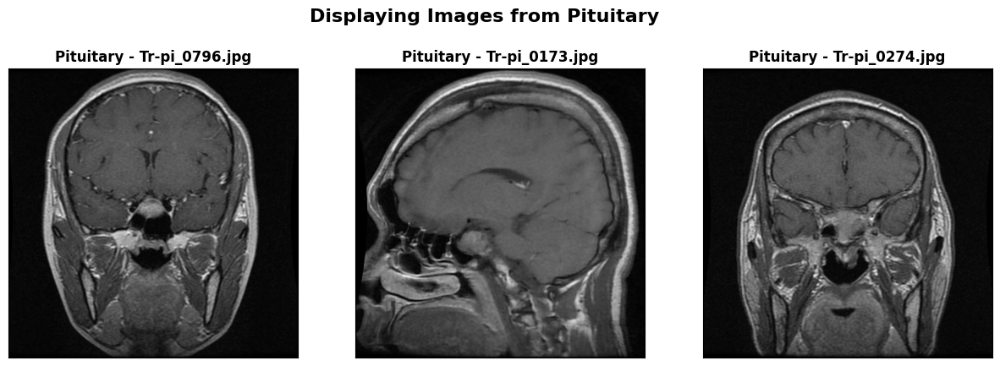

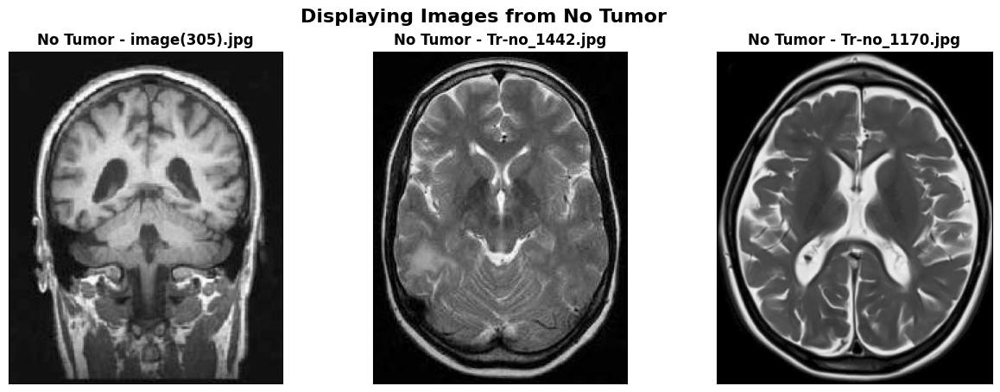

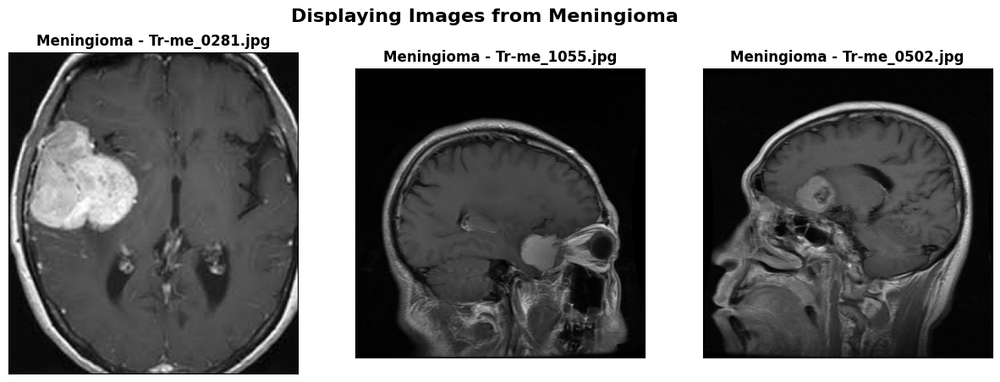

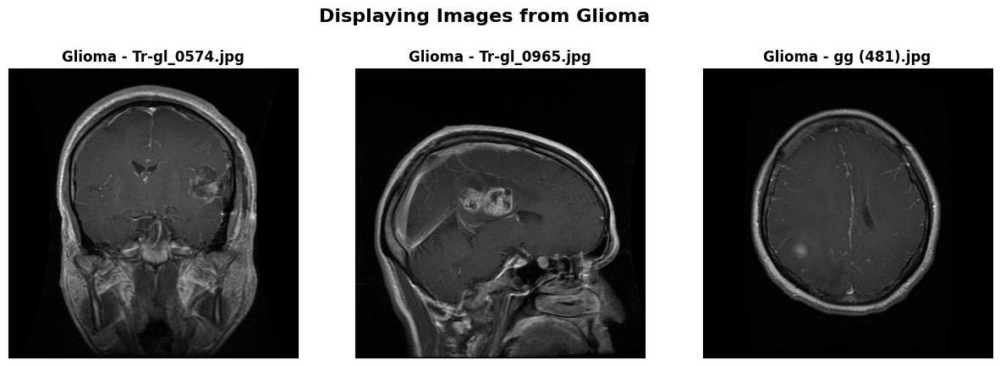

In [19]:
def load_data(directory):
    images =[]
    labels = []
    for class_name in os.listdir(directory):
        images_path = os.path.join(directory, class_name, 'images')
        labels_path = os.path.join(directory, class_name, 'labels')
        for image in os.listdir(images_path):
            img = cv2.imread(os.path.join(images_path, image))
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            label_file = image.replace('.jpg', '.txt')
            label_file_path = os.path.join(labels_path, label_file)
            if os.path.exists(label_file_path):
                with open(label_file_path, 'r') as file:
                    label_data = file.readline().strip().split()
                    if len(label_data) > 0:
                        images.append(img)
                        labels.append(label_data)
                    else:
                        print(f"Label file {label_file_path} is empty, skipping this image.")
            else:
                print(f"Label file {label_file_path} not found, skipping this image.")
    return images, labels

# Paths to data directories
train_path = '/kaggle/input/mri-for-brain-tumor-with-bounding-boxes/Train'
val_path = '/kaggle/input/mri-for-brain-tumor-with-bounding-boxes/Val'

# Load training and validation data
train_images, train_labels = load_data(train_path)
val_images, val_labels = load_data(val_path)

def display_random_images(directory, num_images=3):
#     images, labels = load_data(train_path)
    
    for class_name in os.listdir(directory):
        class_path = os.path.join(directory, class_name)
        images_path = os.path.join(directory, class_name, 'images')
        images = os.listdir(images_path)
        selected_images = random.sample(images, num_images)
        
        fig, axes = plt.subplots(1,3, figsize=(15,5))
        fig.suptitle(f"Displaying Images from {class_name}", fontsize=16, fontweight='bold')
        
        for ax, image in zip(axes, selected_images):
            image_path = os.path.join(images_path, image)
            img = mpimg.imread(image_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            ax.imshow(img)
            ax.set_title(f"{class_name} - {os.path.basename(image)}",fontweight='bold')
            ax.set_xticks([])
            ax.set_yticks([])

display_random_images(train_path)

# <p style="background-image: url(https://png.pngtree.com/thumb_back/fh260/background/20231027/pngtree-hexagonal-abstract-background-with-a-black-textured-surface-image_13704307.png);font-family:calibri;font-size:140%;color: #FFD700; text-align:center;border-radius:20px 20px 20px 20px; padding:20px; border:solid 7px #FFD700;"> **IMAGES PREPROCESSING** 

OpenCV (cv2) offers a wide range of functions for image preprocessing. Here are some common operations and the corresponding functions:

# 1. **Reading and Displaying Images:**

* **cv2.imread(filename, flags):** Reads an image from a file. The **flags** parameter specifies the color type of the image. Common flags include **cv2.IMREAD_COLOR** (default, loads a color image), **cv2.IMREAD_GRAYSCALE** (loads a grayscale image), and **cv2.IMREAD_UNCHANGED** (loads the image as is, including alpha channel).
* **cv2.imshow(window_name, image)**: Displays an image in a window.
* **cv2.waitKey(delay)**: Waits for a key event. The delay parameter specifies the time in milliseconds. If 0, it waits indefinitely.
* **cv2.destroyAllWindows()**: Closes all OpenCV windows.

# 2. **Resizing Images:**

* **cv2.resize(image, dsize, fx, fy, interpolation):** Resizes an image to the specified dimensions. dsize is the new size, **fx** and **fy** are scaling factors. interpolation can be **cv2.INTER_LINEAR, cv2.INTER_CUBIC, or cv2.INTER_NEAREST,** among others.

# 3. **Cropping Images:**

You can crop an image using slicing. For example: **cropped_image = image[y:y+h, x:x+w]**, where **(x, y)** is the top-left corner and **(w, h)** is the width and height of the cropped area.

# 4. **Color Conversion:**

* **cv2.cvtColor(image, code):** Converts an image from one color space to another. For example, cv2.COLOR_BGR2GRAY converts an image from BGR to grayscale.


Thre are many functions related to image pre-processing with **cv2** but we will be using only resizing.

In [17]:
# Image Preprocessing
def images_preprocessing(images):
    processed_images = []
    for img in images:
        img_resized = cv2.resize(img, (640, 640))
        processed_images.append(img_resized)
    return np.array(processed_images)

train_images = images_preprocessing(train_images)
val_images   = images_preprocessing(val_images)


# <p style="background-image: url(https://png.pngtree.com/thumb_back/fh260/background/20231027/pngtree-hexagonal-abstract-background-with-a-black-textured-surface-image_13704307.png);font-family:calibri;font-size:140%;color: #FFD700; text-align:center;border-radius:20px 20px 20px 20px; padding:20px; border:solid 7px #FFD700;"> **IMAGES COUNT IN EACH CLASS** 

In [9]:
def count_images_in_folders(base_path):
    image_counts = []
    
    # Get all directories in the base_path
    main_directories = [d for d in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, d))]
    
    for main_dir in main_directories:
        images_dir_path = os.path.join(base_path, main_dir, 'images')
        
        images = [f for f in os.listdir(images_dir_path) if os.path.isfile(os.path.join(images_dir_path, f))]
        
        print(f'\033[1mNumber of Images in {main_dir} : {len(images)}\033[0m')
        image_counts.append({'Class': main_dir, 'Count': len(images)})
    df = pd.DataFrame(image_counts).sort_values(by='Count',ascending=False)

    colors = ['#a6a832','#32a0a8', '#599173', '#bfbf95']
    fig = go.Figure(data=[go.Pie(labels=df['Class'], values = df['Count'], pull=[0.1,0,0,0],
                             textinfo ='label+percent', marker=dict(colors=colors, line=dict(color='black', width=2)))])
    fig.update_layout(paper_bgcolor='#dff2ef', plot_bgcolor='#dff2ef', title = 'Number of Images in Each Class', width=650, height=600, title_x=0.5, 
                  title_font_family="Times New Roman", title_font_color="#191e1f", title_font_size=30, font_family="Times New Roman", font_size=15)
    fig.show()
    return 

base_path = '/kaggle/input/mri-for-brain-tumor-with-bounding-boxes/Train'
count_images_in_folders(base_path)

Number of Images in Pituitary : 1424
Number of Images in No Tumor : 711
Number of Images in Meningioma : 1449
Number of Images in Glioma : 1153


# <p style="background-image: url(https://png.pngtree.com/thumb_back/fh260/background/20231027/pngtree-hexagonal-abstract-background-with-a-black-textured-surface-image_13704307.png);font-family:calibri;font-size:140%;color: #FFD700; text-align:center;border-radius:20px 20px 20px 20px; padding:20px; border:solid 7px #FFD700;"> **LABELS COUNT IN EACH CLASS** 

Number of Labels in Pituitary : 1424
Number of Labels in No Tumor : 711
Number of Labels in Meningioma : 1449
Number of Labels in Glioma : 1153


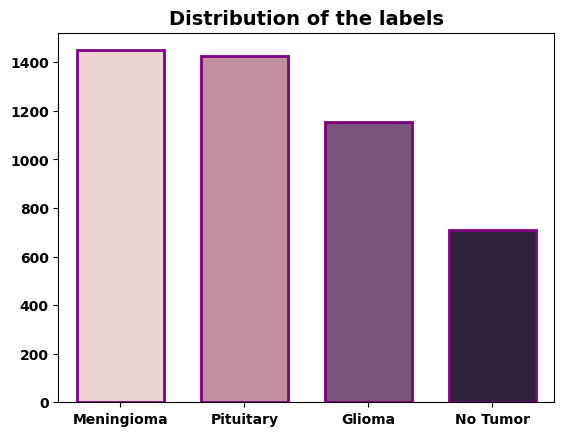

In [10]:
def count_labels_in_folders(base_path):
    label_counts = []
    
    # Get all directories in the base_path
    main_directories = [d for d in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, d))]
    
    for main_dir in main_directories:
        label_dir_path = os.path.join(base_path, main_dir, 'labels')
        
        labels = [f for f in os.listdir(label_dir_path) if os.path.isfile(os.path.join(label_dir_path, f))]
        
        print(f'\033[1mNumber of Labels in {main_dir} : {len(labels)}\033[0m')
        label_counts.append({'Class': main_dir, 'Count': len(labels)})
    df1 = pd.DataFrame(label_counts).sort_values(by='Count',ascending=False)

    sns.barplot(df1, x='Class', y='Count', width=0.7, edgecolor='purple', linewidth=2, palette=sns.cubehelix_palette(n_colors=len(df1)))
    plt.title("Distribution of the labels", weight='bold', fontsize=14)
    plt.xticks(color='black',weight='bold')
    plt.yticks(color='black',weight='bold')
    plt.xlabel('', weight='bold', fontsize=14)
    plt.ylabel('',weight='bold', fontsize=14)
    plt.grid(False)
    return 

base_path = '/kaggle/input/mri-for-brain-tumor-with-bounding-boxes/Train'
count_labels_in_folders(base_path)

# <p style="background-image: url(https://png.pngtree.com/thumb_back/fh260/background/20231027/pngtree-hexagonal-abstract-background-with-a-black-textured-surface-image_13704307.png);font-family:calibri;font-size:140%;color: #FFD700; text-align:center;border-radius:20px 20px 20px 20px; padding:20px; border:solid 7px #FFD700;"> **YAML CONFIGURATION FILE FOR YOLO** 

**YAML (YAML Ain't Markup Language)** is a human-readable data serialization format that is often used for configuration files and data exchange between languages with different data structures. 

In [11]:
# Create YOLOv8 Dataset Configuration File
dataset_yaml = {
    'path': '/kaggle/input/mri-for-brain-tumor-with-bounding-boxes',
    'train': 'Train',
    'val': 'Val',
    'names': ["Glioma", "Meningioma", "No Tumor", "Pituitary"]
}

with open('/kaggle/working/dataset_yaml.yaml', 'w') as file:
    yaml.dump(dataset_yaml, file)

# <p style="background-image: url(https://png.pngtree.com/thumb_back/fh260/background/20231027/pngtree-hexagonal-abstract-background-with-a-black-textured-surface-image_13704307.png);font-family:calibri;font-size:140%;color: #FFD700; text-align:center;border-radius:20px 20px 20px 20px; padding:20px; border:solid 7px #FFD700;"> **BUILDING & TRAINING YOLO** 

In [12]:
model = YOLO('yolov8n.yaml')
model = YOLO('yolov8n.pt')
train_results = model.train(data='/kaggle/working/dataset_yaml.yaml' , epochs=5, imgsz=640)

100%|██████████| 6.25M/6.25M [00:00<00:00, 118MB/s]

Ultralytics YOLOv8.2.74 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15095MiB)


engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/kaggle/working/dataset_yaml.yaml, epochs=5, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format=torchscript, keras=False, optimize=False, int

100%|██████████| 755k/755k [00:00<00:00, 25.6MB/s]
2024-08-08 13:00:28,172	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-08-08 13:00:28,999	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=4

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /kaggle/input/mri-for-brain-tumor-with-bounding-boxes/Train/Glioma/labels... 4737 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4737/4737 [00:04<00:00, 1035.16it/s]


train: WARNING ⚠️ Cache directory /kaggle/input/mri-for-brain-tumor-with-bounding-boxes/Train/Glioma is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning:

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.

val: Scanning /kaggle/input/mri-for-brain-tumor-with-bounding-boxes/Val/Glioma/labels... 510 images, 3 backgrounds, 0 corrupt: 100%|██████████| 512/512 [00:00<00:00, 792.60it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/mri-for-brain-tumor-with-bounding-boxes/Val/Glioma is not writeable, cache not saved.


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      2.35G      1.022      2.349      1.218          4        640: 100%|██████████| 297/297 [00:55<00:00,  5.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.32it/s]

                   all        512        554      0.756      0.664      0.776      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5       2.3G      1.003      1.334      1.193          4        640: 100%|██████████| 297/297 [00:51<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  5.11it/s]

                   all        512        554      0.665      0.781      0.823      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      2.28G     0.9867      1.049       1.18          1        640: 100%|██████████| 297/297 [00:50<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  5.16it/s]


                   all        512        554      0.717      0.677      0.784      0.558

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5       2.3G     0.9317     0.8785      1.149          3        640: 100%|██████████| 297/297 [00:50<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  5.10it/s]


                   all        512        554       0.88      0.879      0.919      0.701

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      2.29G     0.8594     0.7342      1.115          1        640: 100%|██████████| 297/297 [00:50<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  5.07it/s]

                   all        512        554      0.915      0.855      0.924      0.699



5 epochs completed in 0.079 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.74 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.32it/s]


                   all        512        554      0.878      0.879      0.919      0.701
                Glioma        135        153      0.807      0.791      0.836      0.631
            Meningioma        140        142      0.916      0.923      0.963      0.759
              No Tumor         98         98      0.919      0.927      0.951      0.723
             Pituitary        154        161      0.869      0.876      0.924      0.691
Speed: 0.2ms preprocess, 1.9ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs/detect/train


# <p style="background-image: url(https://png.pngtree.com/thumb_back/fh260/background/20231027/pngtree-hexagonal-abstract-background-with-a-black-textured-surface-image_13704307.png);font-family:calibri;font-size:140%;color: #FFD700; text-align:center;border-radius:20px 20px 20px 20px; padding:20px; border:solid 7px #FFD700;"> **DISPLAYING BOUNDING BOXES WITH CLASS & ACCURACY** 

# **What is a Bounding Box?**
A bounding box is a rectangular box that surrounds an object in an image. It is defined by four parameters that specify the position and size of the rectangle. The purpose of a bounding box is to provide a simplified representation of the object's location and dimensions.

# **Predictions Results**
Yolo_model.predict(image) methode returns a list of three things:\
**1. Bounding Boxes.\
2. Confidence scores.\
3. Class labels.**

Here **model.predict(img)[0]** represents the first prediction in a list for a first image in a batch


0: 640x640 1 Pituitary, 8.5ms
Speed: 2.9ms preprocess, 8.5ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 No Tumor, 7.3ms
Speed: 3.0ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Glioma, 7.3ms
Speed: 2.9ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Pituitary, 7.3ms
Speed: 2.3ms preprocess, 7.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Meningioma, 7.3ms
Speed: 2.3ms preprocess, 7.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 3 Gliomas, 7.7ms
Speed: 2.6ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Pituitary, 7.3ms
Speed: 2.3ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Glioma, 7.3ms
Speed: 2.4ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 64

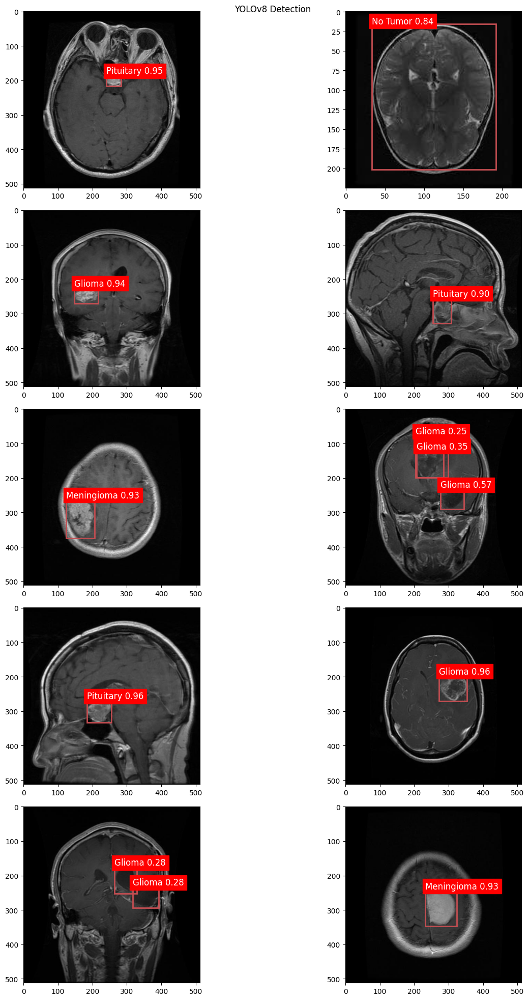

In [20]:
classes = ["Glioma", "Meningioma", "No Tumor", "Pituitary"]

# Function to display detection results with highlighted parts
def display_samples(images, model):
    fig, axes = plt.subplots(5,2,figsize=(15, 20))
    fig.suptitle('YOLOv8 Detection')
    axes = axes.flatten()
    
    selected_images = random.sample(images, 10)
    
    for i, img in enumerate(selected_images):
        result = model.predict(img)[0]  
        ax=axes[i]
        ax.imshow(img)
#         ax = plt.gca()

        for detection in result.boxes:
            x1, y1, x2, y2 = detection.xyxy[0].cpu().numpy()
            conf = detection.conf[0].cpu().numpy()
            cls = detection.cls[0].cpu().numpy()
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=2, edgecolor='r', facecolor='none')
            ax.add_patch(rect)
            ax.text(x1, y1, f"{classes[int(cls)]} {conf:.2f}", color='white', fontsize=12, backgroundcolor='red')
    plt.tight_layout() 

display_samples(val_images, model)

# <p style="background-image: url(https://png.pngtree.com/thumb_back/fh260/background/20231027/pngtree-hexagonal-abstract-background-with-a-black-textured-surface-image_13704307.png);font-family:calibri;font-size:140%;color: #FFD700; text-align:center;border-radius:20px 20px 20px 20px; padding:20px; border:solid 7px #FFD700;"> **YOLOv8n RESULTS** 

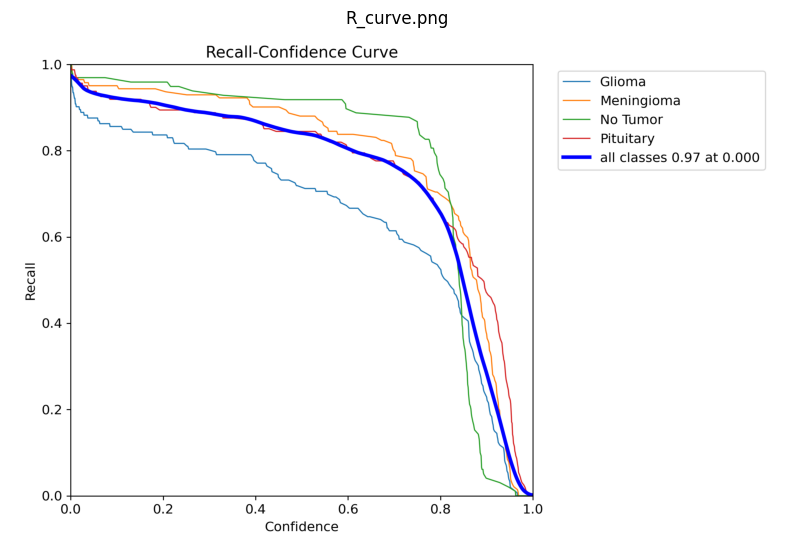

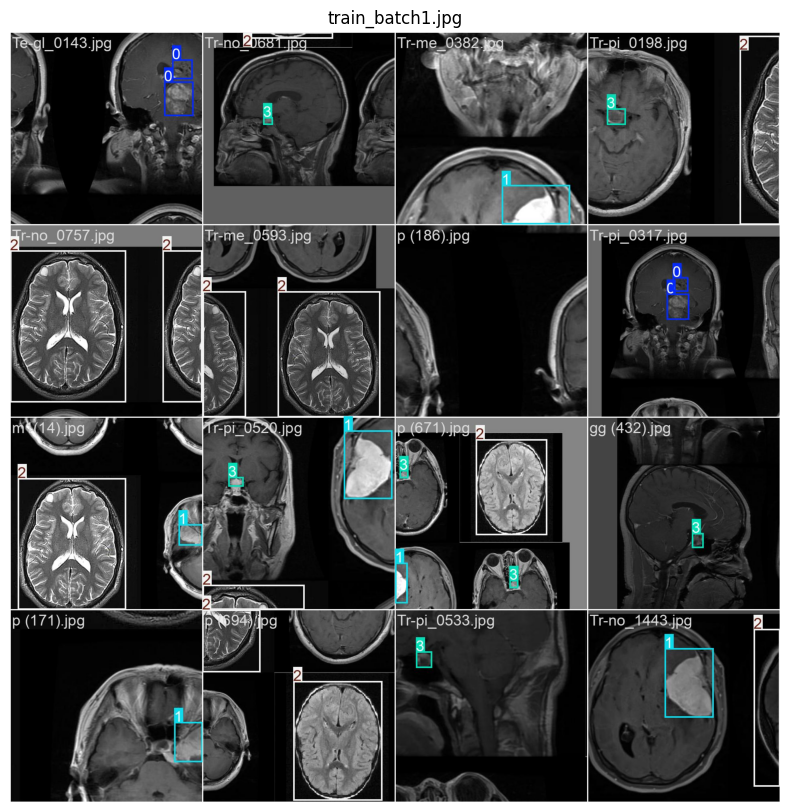

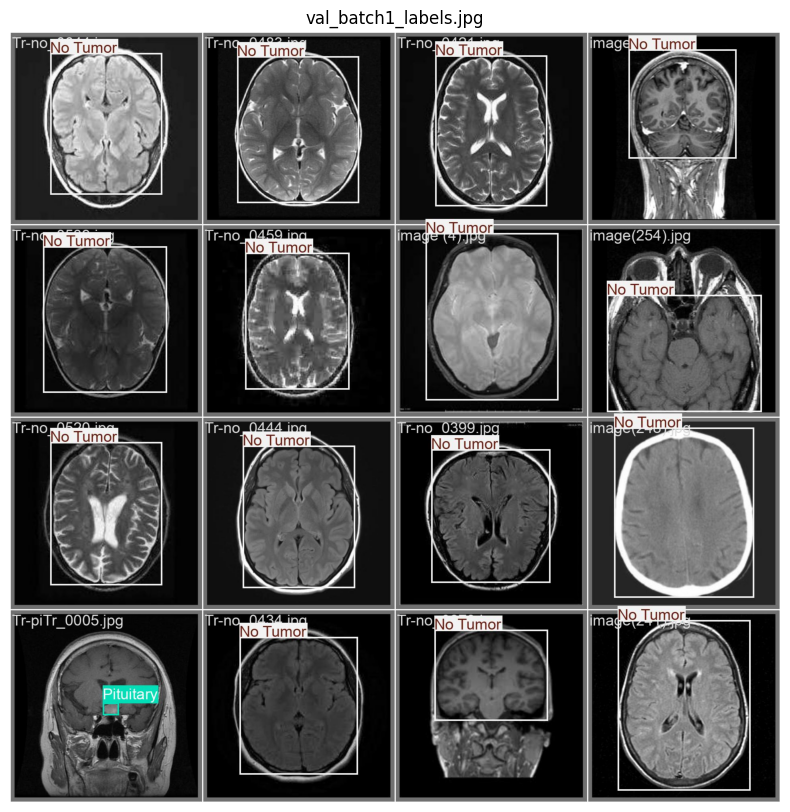

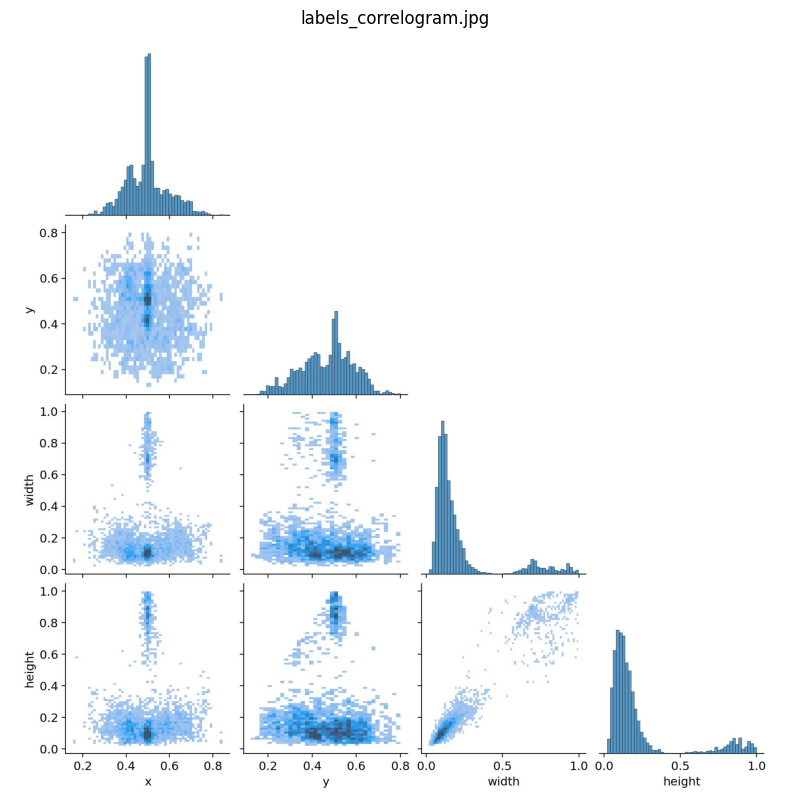

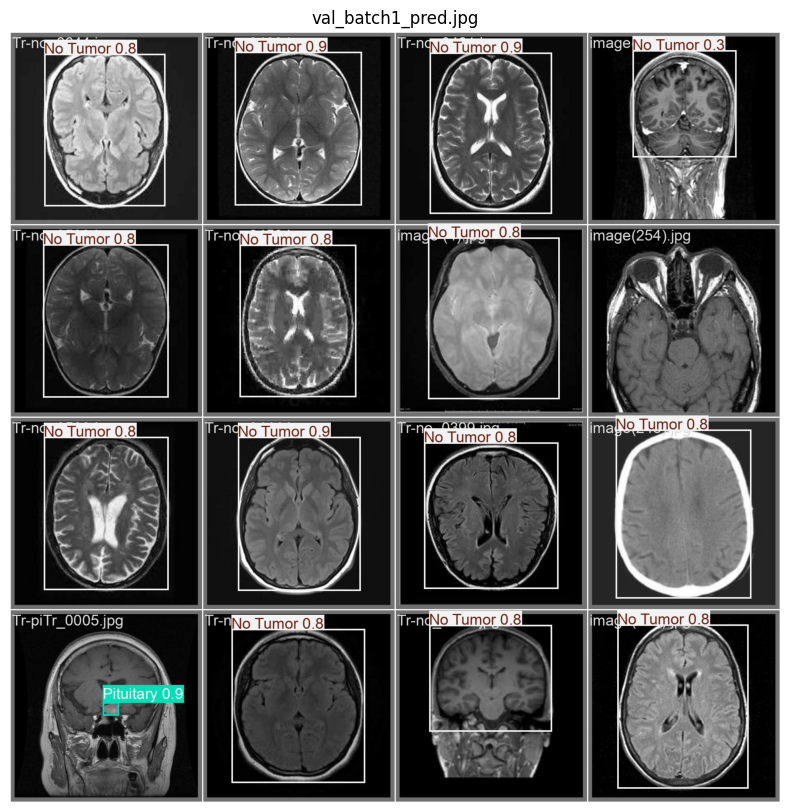

...

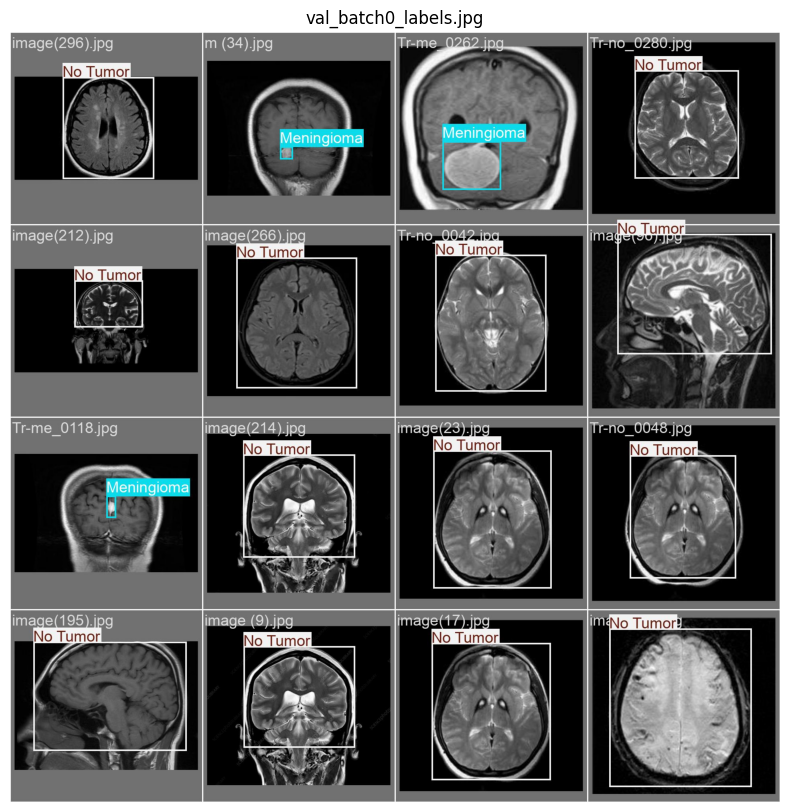

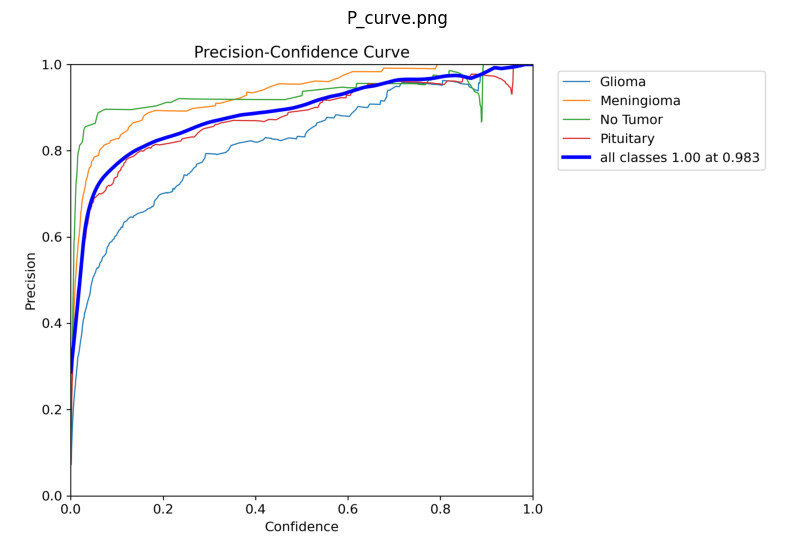

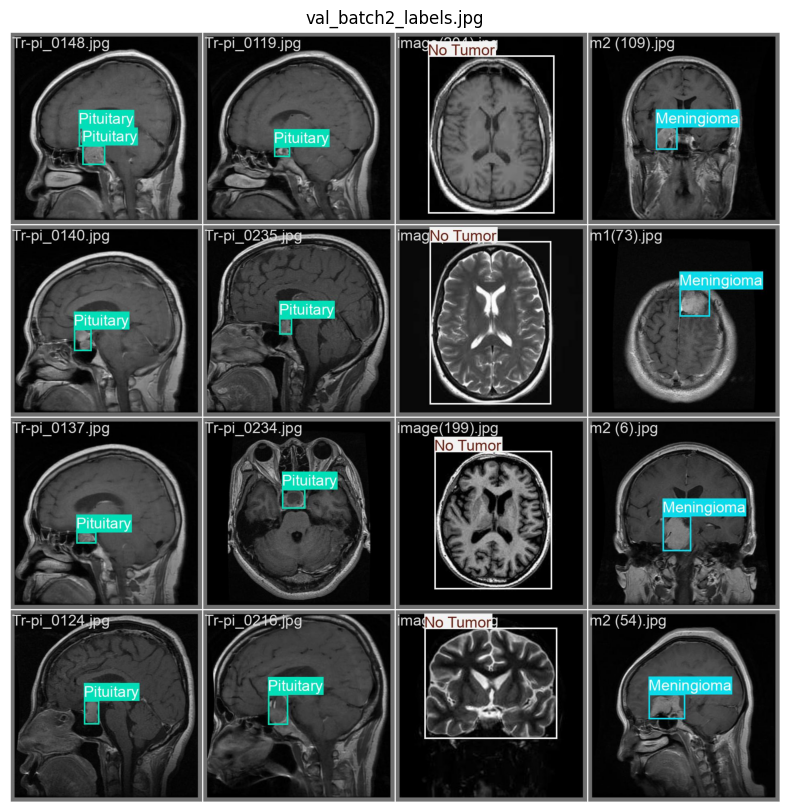

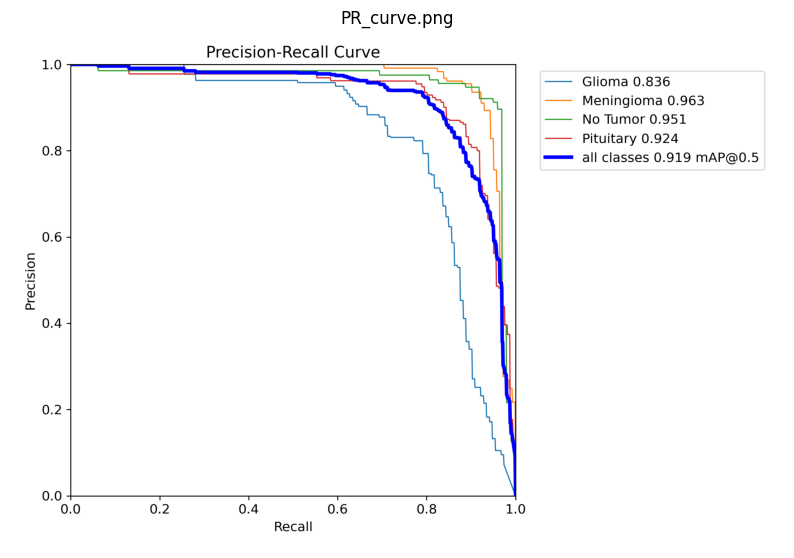

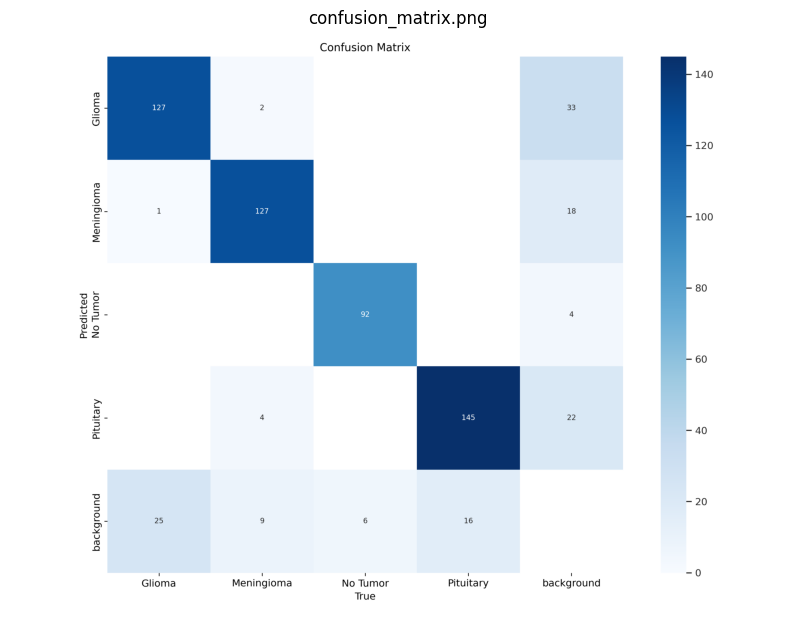

In [16]:
# Path to the results directory (adjust the path based on your setup)
results_dir = '/kaggle/working/runs/detect/train'

# List all images in the directory
result_images = [img for img in os.listdir(results_dir) if img.endswith('.jpg') or img.endswith('.png')]

# Display the images
for img_name in result_images:
    img_path = os.path.join(results_dir, img_name)
    img = Image.open(img_path)
    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    plt.title(img_name)
    plt.axis('off')
    plt.show()